#### Jordi Calbet || 1564567

## Cas Kaggle: Traffic, Driving Style and Road Surface Condition

### Data Analisis

In [103]:
from sklearn.datasets import make_regression
import numpy as np
import pandas as pd
%matplotlib notebook
from matplotlib import pyplot as plt
import scipy.stats
import warnings
warnings.filterwarnings('ignore')
import dill
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
# Visualitzarem només 3 decimals per mostra
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# Carreguem dataset d'exemple
df_corsa_1 = pd.read_csv("opel_corsa_01.csv", delimiter=';')
data = df_corsa_1.values

x = data[:, :16]
y = data[:, 16]

print("Dimensionalitat de la BBDD:", df_corsa_1.shape)
print("Dimensionalitat de les entrades X", x.shape)
print("Dimensionalitat de l'atribut Y", y.shape)

Dimensionalitat de la BBDD: (7392, 17)
Dimensionalitat de les entrades X (7392, 16)
Dimensionalitat de l'atribut Y (7392,)


In [104]:
df_corsa_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7392 entries, 0 to 7391
Data columns (total 17 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   AltitudeVariation          7338 non-null   object
 1   VehicleSpeedInstantaneous  7385 non-null   object
 2   VehicleSpeedAverage        7038 non-null   object
 3   VehicleSpeedVariance       7038 non-null   object
 4   VehicleSpeedVariation      7358 non-null   object
 5   LongitudinalAcceleration   7392 non-null   object
 6   EngineLoad                 7392 non-null   object
 7   EngineCoolantTemperature   7392 non-null   int64 
 8   ManifoldAbsolutePressure   7392 non-null   int64 
 9   EngineRPM                  7392 non-null   int64 
 10  MassAirFlow                7392 non-null   object
 11  IntakeAirTemperature       7392 non-null   int64 
 12  VerticalAcceleration       7392 non-null   object
 13  FuelConsumptionAverage     7295 non-null   object
 14  roadSurf

In [105]:
df_corsa_1.head()

,AltitudeVariation,VehicleSpeedInstantaneous,VehicleSpeedAverage,VehicleSpeedVariance,VehicleSpeedVariation,LongitudinalAcceleration,EngineLoad,EngineCoolantTemperature,ManifoldAbsolutePressure,EngineRPM,MassAirFlow,IntakeAirTemperature,VerticalAcceleration,FuelConsumptionAverage,roadSurface,traffic,drivingStyle
0,NaN,0,NaN,NaN,NaN,"0,0156","25,49019623",64,100,801,"7,849999905",22,"-0,0078",NaN,SmoothCondition,LowCongestionCondition,EvenPaceStyle
1,NaN,0,NaN,NaN,NaN,"0,0156","25,49019623",64,100,803,"7,889999866",22,"-0,0156",NaN,SmoothCondition,LowCongestionCondition,EvenPaceStyle
2,NaN,NaN,NaN,NaN,NaN,"0,0273","25,88235283",64,100,800,"7,769999981",22,"-0,0273",NaN,SmoothCondition,LowCongestionCondition,EvenPaceStyle
3,NaN,NaN,NaN,NaN,NaN,"0,0391","25,88235283",64,100,798,"7,769999981",22,"-0,0273",NaN,SmoothCondition,LowCongestionCondition,EvenPaceStyle
4,NaN,0,NaN,NaN,NaN,"0,0469","25,88235283",65,100,798,"7,940000057",22,"-0,0312",NaN,SmoothCondition,LowCongestionCondition,EvenPaceStyle


In [106]:
#Substituim els NA per -1
dataset = df_corsa_1.fillna(value = -1)
dataset.head()

,AltitudeVariation,VehicleSpeedInstantaneous,VehicleSpeedAverage,VehicleSpeedVariance,VehicleSpeedVariation,LongitudinalAcceleration,EngineLoad,EngineCoolantTemperature,ManifoldAbsolutePressure,EngineRPM,MassAirFlow,IntakeAirTemperature,VerticalAcceleration,FuelConsumptionAverage,roadSurface,traffic,drivingStyle
0,-1,0,-1,-1,-1,"0,0156","25,49019623",64,100,801,"7,849999905",22,"-0,0078",-1,SmoothCondition,LowCongestionCondition,EvenPaceStyle
1,-1,0,-1,-1,-1,"0,0156","25,49019623",64,100,803,"7,889999866",22,"-0,0156",-1,SmoothCondition,LowCongestionCondition,EvenPaceStyle
2,-1,-1,-1,-1,-1,"0,0273","25,88235283",64,100,800,"7,769999981",22,"-0,0273",-1,SmoothCondition,LowCongestionCondition,EvenPaceStyle
3,-1,-1,-1,-1,-1,"0,0391","25,88235283",64,100,798,"7,769999981",22,"-0,0273",-1,SmoothCondition,LowCongestionCondition,EvenPaceStyle
4,-1,0,-1,-1,-1,"0,0469","25,88235283",65,100,798,"7,940000057",22,"-0,0312",-1,SmoothCondition,LowCongestionCondition,EvenPaceStyle


In [107]:
from sklearn import preprocessing
#Codifiquem el nom dels artistes
encoder = preprocessing.LabelEncoder() 
dataset["roadSurface"]=encoder.fit_transform(dataset["roadSurface"])
dataset

,AltitudeVariation,VehicleSpeedInstantaneous,VehicleSpeedAverage,VehicleSpeedVariance,VehicleSpeedVariation,LongitudinalAcceleration,EngineLoad,EngineCoolantTemperature,ManifoldAbsolutePressure,EngineRPM,MassAirFlow,IntakeAirTemperature,VerticalAcceleration,FuelConsumptionAverage,roadSurface,traffic,drivingStyle
0,-1,0,-1,-1,-1,"0,0156","25,49019623",64,100,801,"7,849999905",22,"-0,0078",-1,0,LowCongestionCondition,EvenPaceStyle
1,-1,0,-1,-1,-1,"0,0156","25,49019623",64,100,803,"7,889999866",22,"-0,0156",-1,0,LowCongestionCondition,EvenPaceStyle
2,-1,-1,-1,-1,-1,"0,0273","25,88235283",64,100,800,"7,769999981",22,"-0,0273",-1,0,LowCongestionCondition,EvenPaceStyle
3,-1,-1,-1,-1,-1,"0,0391","25,88235283",64,100,798,"7,769999981",22,"-0,0273",-1,0,LowCongestionCondition,EvenPaceStyle
4,-1,0,-1,-1,-1,"0,0469","25,88235283",65,100,798,"7,940000057",22,"-0,0312",-1,0,LowCongestionCondition,EvenPaceStyle
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7387,"-4,9000244","110,7885513","114,2488227","37,91601699","1,8014297","0,0273","17,64705849",82,111,2216,"18,01000023",21,"0,1406","9,631930351",0,LowCongestionCondition,EvenPaceStyle
7388,"-5,2000122","110,7885513","114,0799377","37,33526408",0,"0,0625","23,13725471",82,112,2209,"16,89999962",20,"0,1289","9,56551075",0,LowCongestionCondition,EvenPaceStyle
7389,-5,"111,6892776","113,9148057","36,44661885","0,9007263","0,0391","29,80392265",82,113,2208,"18,76000023",20,"0,1016","9,495972633",0,LowCongestionCondition,EvenPaceStyle
7390,"-5,2000122","111,0137405","113,6933788","34,71162787","-0,6755371","0,0625","37,64706039",82,120,2210,"21,69000053",21,"0,0742","9,433367729",0,LowCongestionCondition,EvenPaceStyle


In [108]:
#treiem finalment les columnes traffic i drivingStyle ja que no son necessaries al ser totes iguals
del dataset["traffic"]
del dataset["drivingStyle"]
dataset

,AltitudeVariation,VehicleSpeedInstantaneous,VehicleSpeedAverage,VehicleSpeedVariance,VehicleSpeedVariation,LongitudinalAcceleration,EngineLoad,EngineCoolantTemperature,ManifoldAbsolutePressure,EngineRPM,MassAirFlow,IntakeAirTemperature,VerticalAcceleration,FuelConsumptionAverage,roadSurface
0,-1,0,-1,-1,-1,"0,0156","25,49019623",64,100,801,"7,849999905",22,"-0,0078",-1,0
1,-1,0,-1,-1,-1,"0,0156","25,49019623",64,100,803,"7,889999866",22,"-0,0156",-1,0
2,-1,-1,-1,-1,-1,"0,0273","25,88235283",64,100,800,"7,769999981",22,"-0,0273",-1,0
3,-1,-1,-1,-1,-1,"0,0391","25,88235283",64,100,798,"7,769999981",22,"-0,0273",-1,0
4,-1,0,-1,-1,-1,"0,0469","25,88235283",65,100,798,"7,940000057",22,"-0,0312",-1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7387,"-4,9000244","110,7885513","114,2488227","37,91601699","1,8014297","0,0273","17,64705849",82,111,2216,"18,01000023",21,"0,1406","9,631930351",0
7388,"-5,2000122","110,7885513","114,0799377","37,33526408",0,"0,0625","23,13725471",82,112,2209,"16,89999962",20,"0,1289","9,56551075",0
7389,-5,"111,6892776","113,9148057","36,44661885","0,9007263","0,0391","29,80392265",82,113,2208,"18,76000023",20,"0,1016","9,495972633",0
7390,"-5,2000122","111,0137405","113,6933788","34,71162787","-0,6755371","0,0625","37,64706039",82,120,2210,"21,69000053",21,"0,0742","9,433367729",0


In [109]:
#Passem totes les variables a floats
dataset["AltitudeVariation"] = [float(str(i).replace(",", "")) for i in dataset["AltitudeVariation"]]
dataset["VehicleSpeedInstantaneous"] = [float(str(i).replace(",", "")) for i in dataset["VehicleSpeedInstantaneous"]]
dataset["VehicleSpeedAverage"] = [float(str(i).replace(",", "")) for i in dataset["VehicleSpeedAverage"]]
dataset["VehicleSpeedVariance"] = [float(str(i).replace(",", "")) for i in dataset["VehicleSpeedVariance"]]
dataset["VehicleSpeedVariation"] = [float(str(i).replace(",", "")) for i in dataset["VehicleSpeedVariation"]]
dataset["LongitudinalAcceleration"] = [float(str(i).replace(",", "")) for i in dataset["LongitudinalAcceleration"]]
dataset["EngineLoad"] = [float(str(i).replace(",", "")) for i in dataset["EngineLoad"]]
dataset["EngineCoolantTemperature"] = [float(str(i).replace(",", "")) for i in dataset["EngineCoolantTemperature"]]
dataset["ManifoldAbsolutePressure"] = [float(str(i).replace(",", "")) for i in dataset["ManifoldAbsolutePressure"]]
dataset["EngineRPM"] = [float(str(i).replace(",", "")) for i in dataset["EngineRPM"]]
dataset["MassAirFlow"] = [float(str(i).replace(",", "")) for i in dataset["MassAirFlow"]]
dataset["IntakeAirTemperature"] = [float(str(i).replace(",", "")) for i in dataset["IntakeAirTemperature"]]
dataset["VerticalAcceleration"] = [float(str(i).replace(",", "")) for i in dataset["VerticalAcceleration"]]
dataset["FuelConsumptionAverage"] = [float(str(i).replace(",", "")) for i in dataset["FuelConsumptionAverage"]]
dataset["roadSurface"] = [float(str(i).replace(",", "")) for i in dataset["roadSurface"]]
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7392 entries, 0 to 7391
Data columns (total 15 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   AltitudeVariation          7392 non-null   float64
 1   VehicleSpeedInstantaneous  7392 non-null   float64
 2   VehicleSpeedAverage        7392 non-null   float64
 3   VehicleSpeedVariance       7392 non-null   float64
 4   VehicleSpeedVariation      7392 non-null   float64
 5   LongitudinalAcceleration   7392 non-null   float64
 6   EngineLoad                 7392 non-null   float64
 7   EngineCoolantTemperature   7392 non-null   float64
 8   ManifoldAbsolutePressure   7392 non-null   float64
 9   EngineRPM                  7392 non-null   float64
 10  MassAirFlow                7392 non-null   float64
 11  IntakeAirTemperature       7392 non-null   float64
 12  VerticalAcceleration       7392 non-null   float64
 13  FuelConsumptionAverage     7392 non-null   float

In [110]:
dataset.shape

(7392, 15)

In [111]:
#Definim la variable a classificar (roadSurface)
X = dataset.values[:, :14]
y = dataset.values[:, 14]

<IPython.core.display.Javascript object>


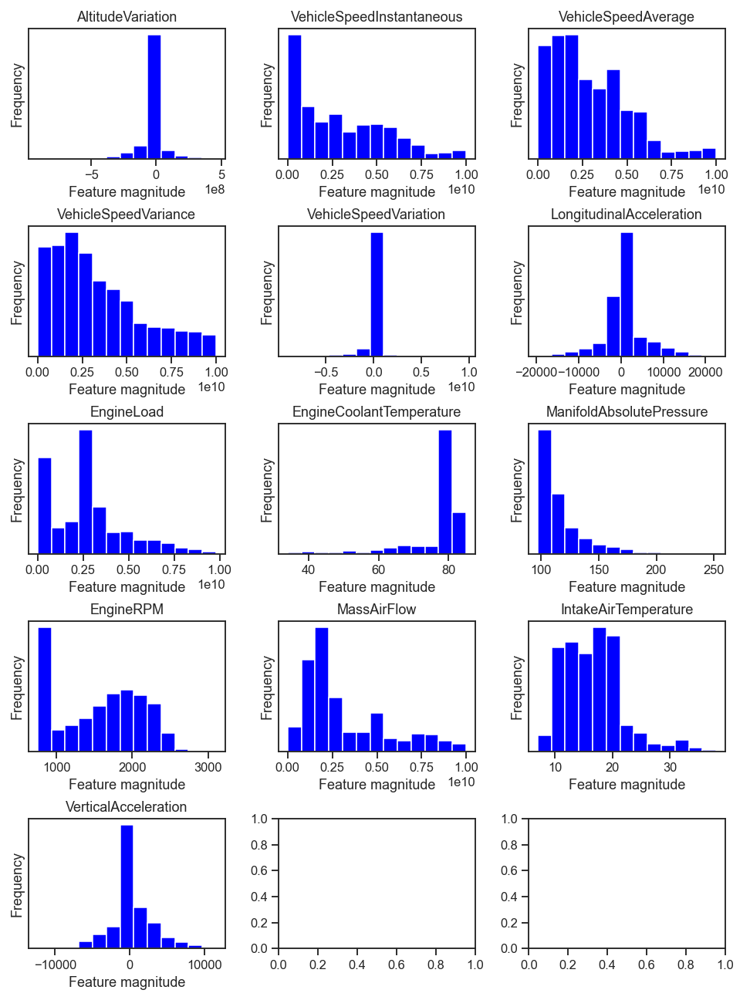

In [112]:
#Mostrem histogrames dels atributs
import mglearn
fig, axes = plt.subplots(5,3,figsize=(9,12))
ax = axes.ravel()

for i in range(13):
    ax[i].hist(dataset.iloc[:,i], bins=13, color = 'blue')
    ax[i].set_title(list(dataset)[i])
    ax[i].set_yticks(())
    ax[i].set_xlabel("Feature magnitude")
    ax[i].set_ylabel("Frequency")

fig.tight_layout()

<IPython.core.display.Javascript object>


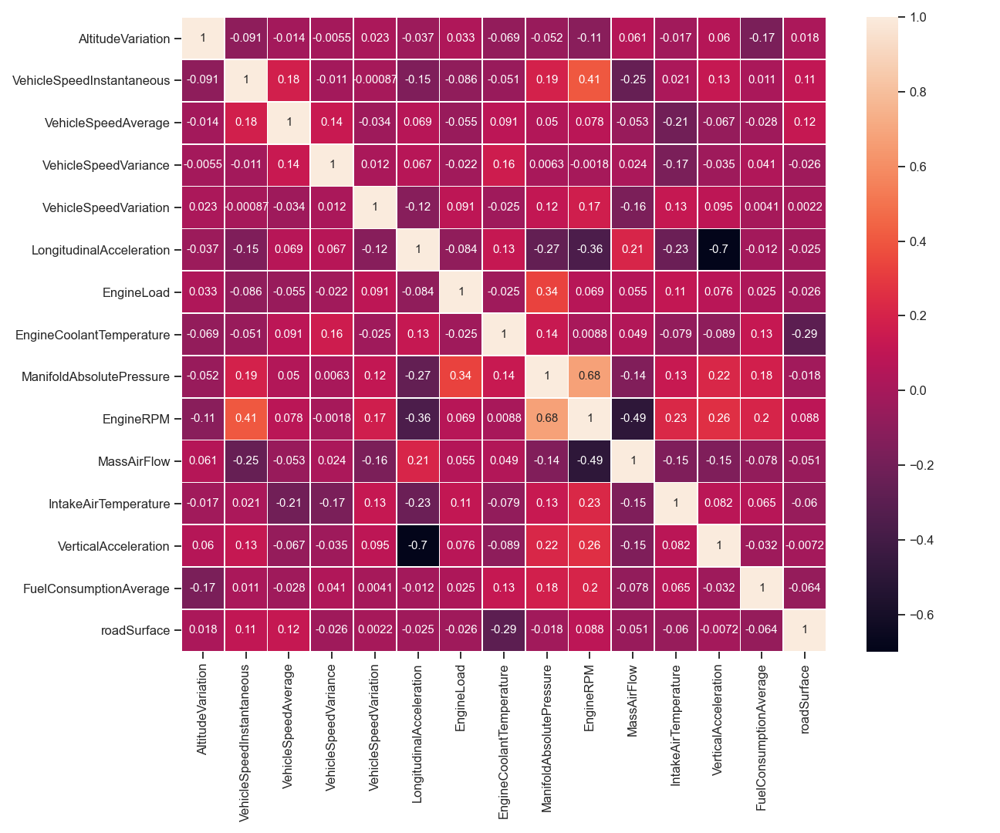

In [113]:
#Mostrem la matriu de correlacions
correlacio = dataset.corr()
fig, ax=plt.subplots(figsize=(12,10))
sns.heatmap(correlacio, annot=True,linewidths=.5, ax=ax)
fig.tight_layout()

<IPython.core.display.Javascript object>


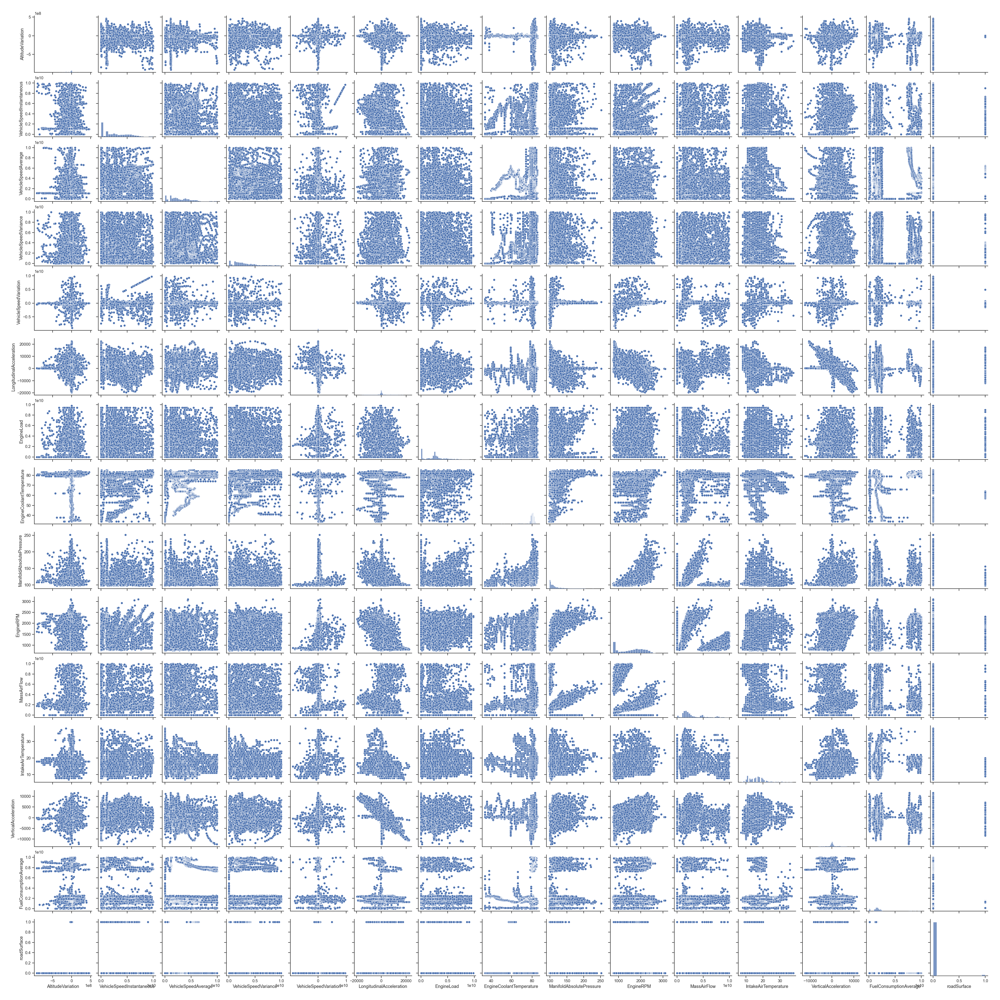

In [114]:
#Mostrem el pairplot de tots els atributs
sns.pairplot(dataset)

<IPython.core.display.Javascript object>


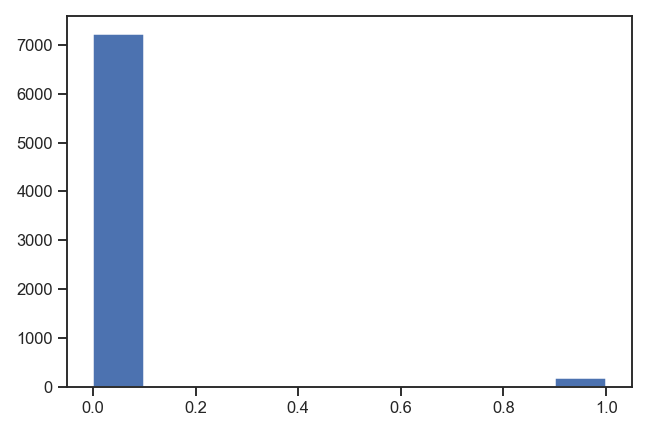

In [116]:
#Mostrem un histograma del atribut roadSurface
fig, ax=plt.subplots()
plt.hist(list(y))
fig.tight_layout()

### Model selection

In [168]:
#Definim train i test, estandaritzant les dades
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 10, test_size = 0.2)
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

print(X_train.shape)
print(y_train.shape)

(5913, 14)
(5913,)


In [169]:
#Importem funcions necesaries per la creació dels models
from sklearn.metrics import confusion_matrix
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.multiclass import OneVsOneClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.multiclass import OutputCodeClassifier
from sklearn import neighbors
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from xgboost import plot_importance
from sklearn.ensemble import StackingClassifier
from sklearn.base import clone
from scipy.stats import uniform, randint
from sklearn import utils
import time

In [170]:
#Definim les funcions que farem servir
import statistics
def score_without10(model,X_test,y_test):
    count=0
    count_valid=0
    correct=0
    predicted_y=model.predict(X_test)
    for y in y_test:
        if(y!=10):
            count_valid+=1
            if(y==predicted_y[count]):
                correct+=1
        count+=1
    return(correct/count_valid)

def Average(lst):
    return sum(lst) / len(lst)

def Median(lst):
    return(statistics.median(lst))

def score_per_class(model,X_test,y_test):
    matrix = confusion_matrix(list(y_test), list(model.predict(X_test)))
    return((matrix.diagonal()/matrix.sum(axis=1)).tolist())

def namestr(obj, namespace):
    return [name for name in namespace if namespace[name] is obj]

def evaluate_model(cv,model):
    scores = cross_val_score(model, X_test, y_test, scoring='accuracy', cv=cv, n_jobs=-1)
    return scores.mean(), scores.min(), scores.max()

In [171]:
#Model One vs One fent servir regressió logistica
i = time.time()
model1 = OneVsOneClassifier(LogisticRegression())
model1.fit(X_train, y_train)
f = time.time()
print("Score:")
print(model1.score(X_test, y_test))
print("Time:")
print(f-i)

Score:
0.9891818796484111
Time:
0.03790116310119629


In [172]:
#Model One vs Rest fent servir regressió logistica
i = time.time()
model2 = OneVsRestClassifier(LogisticRegression())
model2.fit(X_train, y_train)
f = time.time()
print("Score:")
print(model2.score(X_test, y_test))
print("Time:")
print(f-i)

Score:
0.9891818796484111
Time:
0.03989243507385254


In [173]:
#Model OutputCode fent servir regressió logistica
i = time.time()
model3 = OutputCodeClassifier(LogisticRegression())
model3.fit(X_train, y_train)
f = time.time()
print("Score:")
print(model3.score(X_test, y_test))
print("Time:")
print(f-i)

Score:
0.9891818796484111
Time:
0.07280135154724121


In [174]:
#Cerca de millors hiperparàmetres per KNN
accuracy=[]
accuracy_w=[]
n_neighbors=[]
for i in range(1,50,2):
    knn=neighbors.KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train, training_scores_encoded)
    accuracy.append(knn.score(X_test, y_test))
    knn=neighbors.KNeighborsClassifier(n_neighbors=i,weights="distance")
    knn.fit(X_train, training_scores_encoded)
    accuracy_w.append(knn.score(X_test, y_test))
    n_neighbors.append(i)

<IPython.core.display.Javascript object>


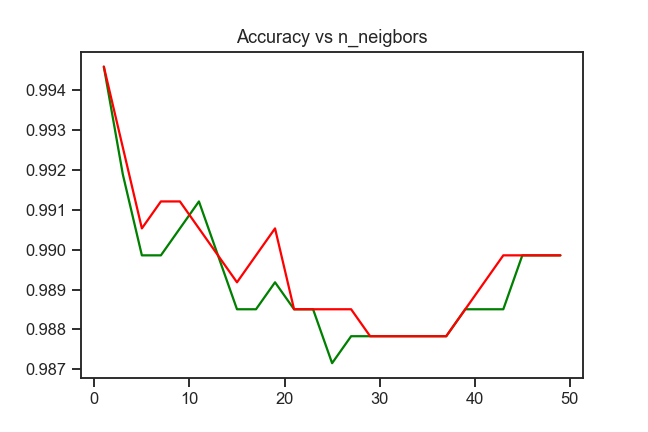

In [175]:
plt.figure()
plt.title("Accuracy vs n_neigbors")
plt.plot(n_neighbors,accuracy, c="green")
plt.plot(n_neighbors,accuracy_w, c="red");

In [176]:
#Millors paràmetres
print('Max Accuracy uniform:')
print(max(accuracy))
print('Number of neighbors:')
print(n_neighbors[accuracy.index(max(accuracy))])
print('Max Accuracy distance weight points:')
print(max(accuracy_w))
print('Number of neighbors:')
print(n_neighbors[accuracy_w.index(max(accuracy_w))])

Max Accuracy uniform:
0.9945909398242055
Number of neighbors:
1
Max Accuracy distance weight points:
0.9945909398242055
Number of neighbors:
1


In [177]:
#Model KNN
i = time.time()
model4=neighbors.KNeighborsClassifier(n_neighbors=n_neighbors[accuracy.index(max(accuracy))]).fit(X_train,y_train)
f = time.time()
print("Score:")
print(model4.score(X_test, y_test))
print("Time:")
print(f-i)

Score:
0.9945909398242055
Time:
0.03889036178588867


In [178]:
#Model KNN amb pesos definits com distància
i = time.time()
model5=neighbors.KNeighborsClassifier(n_neighbors=n_neighbors[accuracy_w.index(max(accuracy_w))],weights="distance").fit(X_train,y_train)
f = time.time()
print("Score:")
print(model5.score(X_test, y_test))
print("Time:")
print(f-i)

Score:
0.9945909398242055
Time:
0.05883955955505371


In [179]:
#Model Decision Tree
i = time.time()
model6 = DecisionTreeClassifier()
model6.fit(X_train, y_train)
f = time.time()
print("Score:")
print(model6.score(X_test, y_test))
print("Time:")
print(f-i)

Score:
1.0
Time:
0.03391242027282715


In [180]:
#Hyperparameter tuning per Decision Tree fent servir tècnica Randomized Serch
param_dist = {"max_depth": [3, None],
              "max_features": randint(1, 16),
              "min_samples_leaf": randint(1, 100),
              "criterion": ["gini", "entropy"],
              "splitter": ["best", "random"]}
i = time.time()
dt = DecisionTreeClassifier()
dt_random = RandomizedSearchCV(estimator = dt, param_distributions = param_dist, n_iter = 2000, cv = 3, verbose=2, n_jobs = -1)
dt_random.fit(X_train, y_train)
f = time.time()

Fitting 3 folds for each of 2000 candidates, totalling 6000 fits


In [181]:
#Millors paràmetres pel model
dt_random.best_params_

{'criterion': 'entropy',
 'max_depth': None,
 'max_features': 11,
 'min_samples_leaf': 12,
 'splitter': 'best'}

In [182]:
#Model Decision Tree aplicant hyperparameter tuning
model7=dt_random.best_estimator_
print("Score:")
print(model7.score(X_test,y_test))
print("Time:")
print(f-i)

Score:
0.9986477349560514
Time:
29.039311408996582


In [183]:
#Model Random Forest 
i = time.time()
model8 = RandomForestClassifier(n_estimators=500)
model8.fit(X_train, y_train)
f = time.time()
print("Score:")
print(model8.score(X_test, y_test))
print("Time:")
print(f-i)

Score:
1.0
Time:
3.707087278366089


In [184]:
#Hyperparameter tuning per Random Forest fent servir tècnica Grid Serch
param_grid = { 
    'n_estimators': [200,500,1000],
    'max_features': ['auto', 'sqrt'],
    'max_depth' : [5,10,20],
    'criterion' :['gini', 'entropy']
}

i = time.time()
rf = RandomForestClassifier()
rf_random = GridSearchCV(estimator = rf, param_grid = param_grid, cv = 3)
rf_random.fit(X_train, y_train)
f = time.time()
rf_bestP=rf_random.best_params_

In [185]:
#Millors paràmetres pel model
rf_random.best_params_

{'criterion': 'gini',
 'max_depth': 20,
 'max_features': 'sqrt',
 'n_estimators': 200}

In [186]:
#Model Random Forest aplicant hyperparameter tuning
model9 = rf_random.best_estimator_
print("Score:")
print(model9.score(X_test, y_test))
print("Time:")
print(f-i)

Score:
1.0
Time:
344.6104066371918


In [194]:
#Model Stacking utilitzant els millors models
level0 = list()
level0.append(('6', clone(model6)))
level0.append(('8', clone(model8)))
level0.append(('9', clone(model9)))
level1 = LogisticRegression(max_iter=10000)
i = time.time()
model10 = StackingClassifier(estimators=level0, final_estimator=level1, cv=5)
model10.fit(X_train,y_train)
f = time.time()
print("Score:")
print(model12.score(X_test, y_test))
print("Time:")
print(f-i)

Score:
0.9993238674780257
Time:
30.69590401649475


In [195]:
#Evaluació dels models
from sklearn.metrics import f1_score
models=[model1,model2,model3,model4,model5,model6,model7,model8,model9,model10]
Averages=[]
Medians=[]
ScoresWO10=[]
scores_per_class=[]
F1=[]
for model in models:
    print(str(namestr(model, globals())[0]))
    print(score_per_class(model,X_test,y_test))
    scores_per_class.append(score_per_class(model,X_test,y_test))
    print(" ")
    print("Average Score:")
    print(Average(score_per_class(model,X_test,y_test)))
    Averages.append(Average(score_per_class(model,X_test,y_test)))
    print(" ")
    print("Median score:")
    print(Median(score_per_class(model,X_test,y_test)))
    Medians.append(Median(score_per_class(model,X_test,y_test)))
    print(" ")
    print("Score without label 10:")
    print(score_without10(model,X_test,y_test))
    ScoresWO10.append(score_without10(model,X_test,y_test))
    print(" ")
    print("F1 score (macro):")
    print(f1_score(y_test,model.predict(X_test),average="macro"))
    F1.append(f1_score(y_test,model.predict(X_test),average="macro"))
    print(" ")

model1
[0.9993145990404386, 0.25]
 
Average Score:
0.6246572995202193
 
Median score:
0.6246572995202193
 
Score without label 10:
0.9891818796484111
 
F1 score (macro):
0.6895791793472557
 
model2
[0.9993145990404386, 0.25]
 
Average Score:
0.6246572995202193
 
Median score:
0.6246572995202193
 
Score without label 10:
0.9891818796484111
 
F1 score (macro):
0.6895791793472557
 
model3
[0.9993145990404386, 0.25]
 
Average Score:
0.6246572995202193
 
Median score:
0.6246572995202193
 
Score without label 10:
0.9891818796484111
 
F1 score (macro):
0.6895791793472557
 
model4
[0.9952021932830706, 0.95]
 
Average Score:
0.9726010966415353
 
Median score:
0.9726010966415353
 
Score without label 10:
0.9945909398242055
 
F1 score (macro):
0.9116698518872433
 
model5
[0.9952021932830706, 0.95]
 
Average Score:
0.9726010966415353
 
Median score:
0.9726010966415353
 
Score without label 10:
0.9945909398242055
 
F1 score (macro):
0.9116698518872433
 
model6
[1.0, 1.0]
 
Average Score:
1.0
 
Medi

<IPython.core.display.Javascript object>


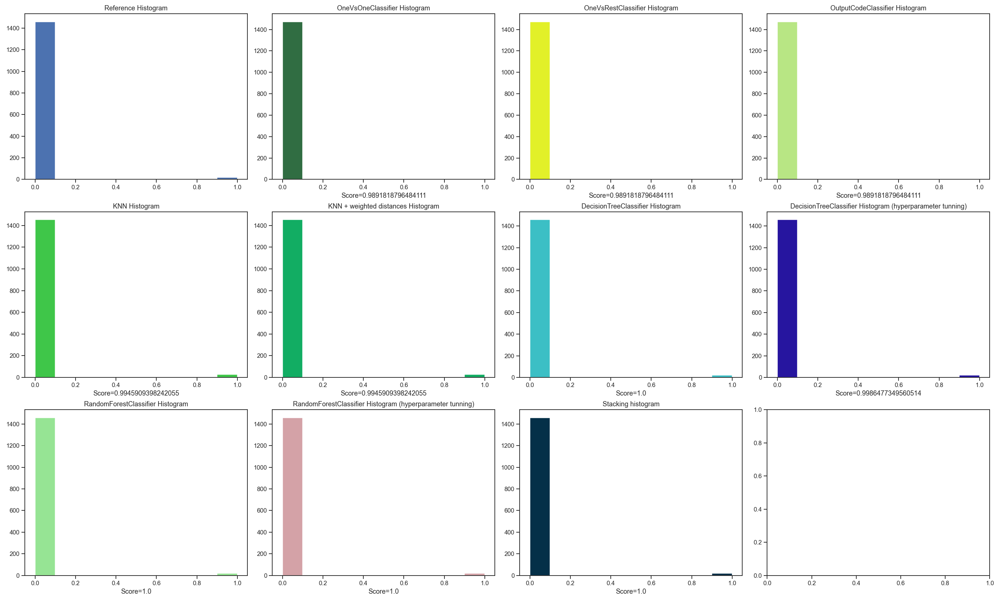

In [196]:
#Mostrem els histogrames de les prediccions per cada model
fig, matrix = plt.subplots(3,4, figsize=(25,15))
matrix[0][0].hist(list(y_test))
matrix[0][0].set_title("Reference Histogram")
matrix[0][1].hist(model1.predict(X_test),color=list(np.random.rand(3,)))
matrix[0][1].set_title("OneVsOneClassifier Histogram")
matrix[0][1].set_xlabel('Score='+str(model1.score(X_test,y_test)))
matrix[0][2].hist(model2.predict(X_test),color=list(np.random.rand(3,)))
matrix[0][2].set_title("OneVsRestClassifier Histogram")
matrix[0][2].set_xlabel('Score='+str(model2.score(X_test,y_test)))
matrix[0][3].hist(model3.predict(X_test),color=list(np.random.rand(3,)))
matrix[0][3].set_title("OutputCodeClassifier Histogram")
matrix[0][3].set_xlabel('Score='+str(model3.score(X_test,y_test)))
matrix[1][0].hist(model4.predict(X_test),color=list(np.random.rand(3,)))
matrix[1][0].set_title("KNN Histogram")
matrix[1][0].set_xlabel('Score='+str(model4.score(X_test,y_test)))
matrix[1][1].hist(model5.predict(X_test),color=list(np.random.rand(3,)))
matrix[1][1].set_title("KNN + weighted distances Histogram")
matrix[1][1].set_xlabel('Score='+str(model5.score(X_test,y_test)))
matrix[1][2].hist(model6.predict(X_test),color=list(np.random.rand(3,)))
matrix[1][2].set_title("DecisionTreeClassifier Histogram")
matrix[1][2].set_xlabel('Score='+str(model6.score(X_test,y_test)))
matrix[1][3].hist(model7.predict(X_test),color=list(np.random.rand(3,)))
matrix[1][3].set_title("DecisionTreeClassifier Histogram (hyperparameter tunning)")
matrix[1][3].set_xlabel('Score='+str(model7.score(X_test,y_test)))
matrix[2][0].hist(model8.predict(X_test),color=list(np.random.rand(3,)))
matrix[2][0].set_title("RandomForestClassifier Histogram")
matrix[2][0].set_xlabel('Score='+str(model8.score(X_test,y_test)))
matrix[2][1].hist(model9.predict(X_test),color=list(np.random.rand(3,)))
matrix[2][1].set_title("RandomForestClassifier Histogram (hyperparameter tunning)")
matrix[2][1].set_xlabel('Score='+str(model9.score(X_test,y_test)))
matrix[2][2].hist(model10.predict(X_test),color=list(np.random.rand(3,)))
matrix[2][2].set_title("Stacking histogram")
matrix[2][2].set_xlabel('Score='+str(model10.score(X_test,y_test)))
plt.tight_layout()

<IPython.core.display.Javascript object>


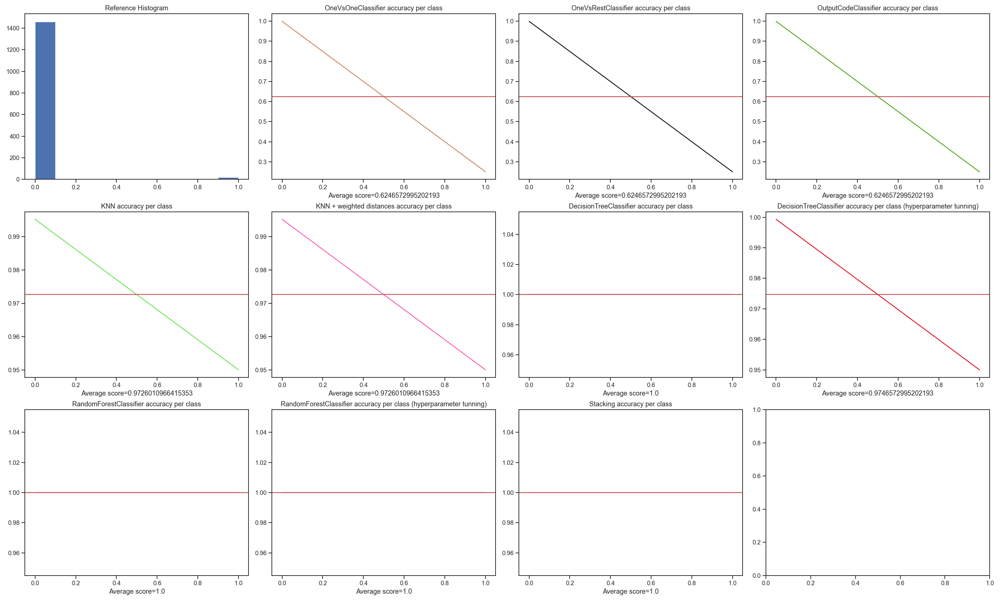

In [197]:
#Mostrem la score per cada classe i la mitjana per cada model
fig, matrix = plt.subplots(3,4, figsize=(25,15))
matrix[0][0].hist(list(y_test))
matrix[0][0].set_title("Reference Histogram")
matrix[0][1].plot(scores_per_class[0], c=list(np.random.rand(3,)))
matrix[0][1].axhline(y=Averages[0], color='r', linestyle='-')
matrix[0][1].set_title("OneVsOneClassifier accuracy per class")
matrix[0][1].set_xlabel('Average score='+str(Averages[0]))
matrix[0][2].plot(scores_per_class[1], c=list(np.random.rand(3,)))
matrix[0][2].axhline(y=Averages[1], color='r', linestyle='-')
matrix[0][2].set_title("OneVsRestClassifier accuracy per class")
matrix[0][2].set_xlabel('Average score='+str(Averages[1]))
matrix[0][3].plot(scores_per_class[2], c=list(np.random.rand(3,)))
matrix[0][3].axhline(y=Averages[2], color='r', linestyle='-')
matrix[0][3].set_title("OutputCodeClassifier accuracy per class")
matrix[0][3].set_xlabel('Average score='+str(Averages[2]))
matrix[1][0].plot(scores_per_class[3], c=list(np.random.rand(3,)))
matrix[1][0].axhline(y=Averages[3], color='r', linestyle='-')
matrix[1][0].set_title("KNN accuracy per class")
matrix[1][0].set_xlabel('Average score='+str(Averages[3]))
matrix[1][1].plot(scores_per_class[4], c=list(np.random.rand(3,)))
matrix[1][1].axhline(y=Averages[4], color='r', linestyle='-')
matrix[1][1].set_title("KNN + weighted distances accuracy per class")
matrix[1][1].set_xlabel('Average score='+str(Averages[4]))
matrix[1][2].plot(scores_per_class[5], c=list(np.random.rand(3,)))
matrix[1][2].axhline(y=Averages[5], color='r', linestyle='-')
matrix[1][2].set_title("DecisionTreeClassifier accuracy per class")
matrix[1][2].set_xlabel('Average score='+str(Averages[5]))
matrix[1][3].plot(scores_per_class[6], c=list(np.random.rand(3,)))
matrix[1][3].axhline(y=Averages[6], color='r', linestyle='-')
matrix[1][3].set_title("DecisionTreeClassifier accuracy per class (hyperparameter tunning)")
matrix[1][3].set_xlabel('Average score='+str(Averages[6]))
matrix[2][0].plot(scores_per_class[7], c=list(np.random.rand(3,)))
matrix[2][0].axhline(y=Averages[7], color='r', linestyle='-')
matrix[2][0].set_title("RandomForestClassifier accuracy per class")
matrix[2][0].set_xlabel('Average score='+str(Averages[7]))
matrix[2][1].plot(scores_per_class[8], c=list(np.random.rand(3,)))
matrix[2][1].axhline(y=Averages[8], color='r', linestyle='-')
matrix[2][1].set_title("RandomForestClassifier accuracy per class (hyperparameter tunning)")
matrix[2][1].set_xlabel('Average score='+str(Averages[8]))
matrix[2][2].plot(scores_per_class[9], c=list(np.random.rand(3,)))
matrix[2][2].axhline(y=Averages[9], color='r', linestyle='-')
matrix[2][2].set_title("Stacking accuracy per class")
matrix[2][2].set_xlabel('Average score='+str(Averages[9]))
plt.tight_layout()

### CROSS VALIDATION

In [199]:
modelsc=[["OneVsOne",model1],
        ["OneVsRest",model2],
        ["OutputCode",model3],
        ["knn",model4],
        ["DecisionTree",model7],
        ["RandomForest",model9],
        ["Stacking",model10]
       ]

In [200]:
for model in modelsc:
    k_mean, k_min, k_max = evaluate_model(5,model[1])
    print(model[0]+': accuracy = %.5f (%.5f,%.5f)' % (k_mean, k_min, k_max))

OneVsOne: accuracy = 0.98783 (0.98644,0.98986)
OneVsRest: accuracy = 0.98783 (0.98644,0.98986)
OutputCode: accuracy = 0.98715 (0.98644,0.98986)
knn: accuracy = 0.98851 (0.98311,0.99324)
DecisionTree: accuracy = 0.99257 (0.98649,0.99662)
RandomForest: accuracy = 0.99392 (0.98986,0.99662)
Stacking: accuracy = 0.99797 (0.99324,1.00000)
